# SETUP

In [ ]:
!pip install pandas-profiling
!pip install --upgrade pandas-profiling
!pip install markupsafe==2.0.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 262 kB 7.5 MB/s 
     |████████████████████████████████| 102 kB 9.0 MB/s 
     |████████████████████████████████| 62 kB 1.1 MB/s 
     |████████████████████████████████| 596 kB 20.1 MB/s 
     |████████████████████████████████| 4.7 MB 40.3 MB/s 
     |████████████████████████████████| 690 kB 45.6 MB/s 
     |████████████████████████████████| 812 kB 5.7 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=56904b72e59b0c3aa16f092a1b156a29eb170583d2837c6f9f722bf5ba1c322d
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295206 sha256=429bc250de1b5bee2ded5163c2703218b1b8b87507ce2

In [ ]:
import pathlib
import glob
import pandas as pd
from pandas_profiling import ProfileReport
from geopy import distance
import numpy as np
import matplotlib.pyplot as plt 
from sklearn import preprocessing

In [ ]:
!git clone https://github.com/rafjaa/LeIA.git

Cloning into 'LeIA'...
remote: Enumerating objects: 88, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (20/20), done.
remote: Total 88 (delta 11), reused 8 (delta 4), pack-reused 64
Unpacking objects: 100% (88/88), done.


In [ ]:
import sys
sys.path.append("/content/LeIA")
from leia import SentimentIntensityAnalyzer
s = SentimentIntensityAnalyzer()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Data sources drive folder 
# data_folder = pathlib.Path("/content/drive/MyDrive/mestrado/ICPR 2022 - Brazilian E-Commerce Public Dataset by Olist/Olist Dataset")
data_folder = pathlib.Path("/content/drive/MyDrive/ICPR 2022 - Brazilian E-Commerce Public Dataset by Olist/Olist Dataset")

In [ ]:
# Dictionary with all separate olist datasets as pandas dataframes
data_dict = {
    'cust_df' : pd.read_csv(data_folder.joinpath('olist_customers_dataset.csv')),
    'geo_df' : pd.read_csv(data_folder.joinpath('olist_geolocation_dataset.csv')),
    'items_df' : pd.read_csv(data_folder.joinpath('olist_order_items_dataset.csv')),
    'pay_df' : pd.read_csv(data_folder.joinpath('olist_order_payments_dataset.csv')),
    'reviews_df' : pd.read_csv(data_folder.joinpath('olist_order_reviews_dataset.csv')),
    'orders_df' : pd.read_csv(data_folder.joinpath('olist_orders_dataset.csv')),
    'products_df' : pd.read_csv(data_folder.joinpath('olist_products_dataset.csv')),
    'sellers_df' : pd.read_csv(data_folder.joinpath('olist_sellers_dataset.csv')),
    'prod_cat_df' : pd.read_csv(data_folder.joinpath('product_category_name_translation.csv'))
}

# DATA EXPLORATION

Relational Schema for all datasets

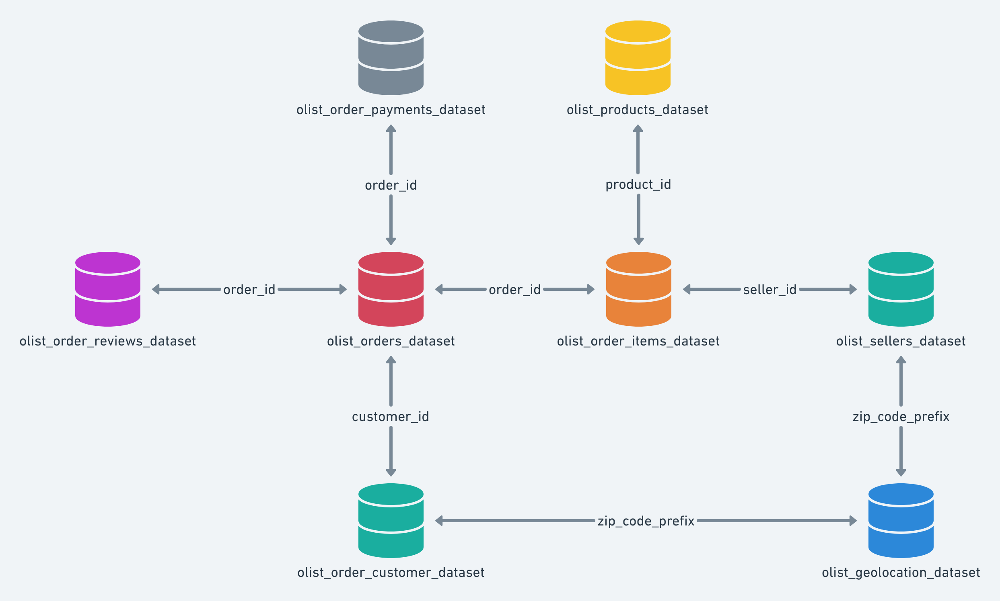

In [ ]:
# Dictionary with profiles for all dataframes
prof_dict = {}
for key in data_dict:
  prof_dict[key] = ProfileReport(data_dict[key])

## Customers (unique)

In [ ]:
prof_dict['cust_df']

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Geolocation

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

RuntimeError: ignored

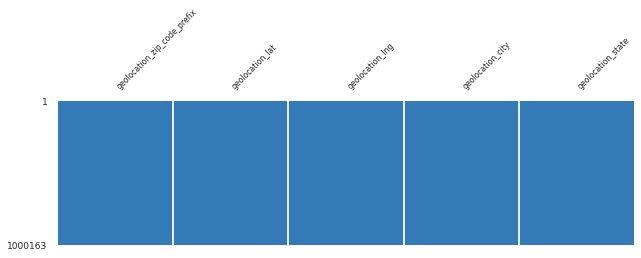

In [ ]:
# Não sei pq ta dando erro, nn consegui resolver
prof_dict['geo_df']

In [ ]:
data_dict['geo_df']

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP
...,...,...,...,...,...
1000158,99950,-28.068639,-52.010705,tapejara,RS
1000159,99900,-27.877125,-52.224882,getulio vargas,RS
1000160,99950,-28.071855,-52.014716,tapejara,RS
1000161,99980,-28.388932,-51.846871,david canabarro,RS


In [ ]:
data_dict['geo_df'][data_dict['geo_df'].duplicated()].sort_values(
    'geolocation_zip_code_prefix')

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
1435,1001,-23.549292,-46.633559,sao paulo,SP
771,1001,-23.550498,-46.634338,sao paulo,SP
596,1001,-23.550498,-46.634338,sao paulo,SP
1004,1001,-23.549292,-46.633559,sao paulo,SP
1246,1001,-23.549292,-46.633559,sao paulo,SP
...,...,...,...,...,...
1000045,99980,-28.388342,-51.845194,david canabarro,RS
1000129,99980,-28.387059,-51.848964,david canabarro,RS
1000002,99980,-28.388342,-51.845194,david canabarro,RS
1000133,99980,-28.386689,-51.847091,david canabarro,RS


In [ ]:
data_dict['geo_df'].drop_duplicates()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP
...,...,...,...,...,...
1000155,99965,-28.180655,-52.034367,agua santa,RS
1000156,99950,-28.072188,-52.011272,tapejara,RS
1000157,99950,-28.068864,-52.012964,tapejara,RS
1000158,99950,-28.068639,-52.010705,tapejara,RS


Obs:

Temos muitas linhas duplicadas

Mesma abreviação de zip code aponda para coordenadas diferentes, porém acho que são próximas, acho que da pra pegar a primeira coordenada de cada código q da boa

Talvez possamos usar as coordenadas para calcular uma feature de distancia entre o cliente e o vendedor?

## Items

In [ ]:
prof_dict['items_df']

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Obs:

O que significa a coluna de order_item_id?

Aparentemente todas as colunas são úteis

## Payments

In [ ]:
prof_dict['pay_df']

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
data_dict['pay_df'][data_dict['pay_df'].duplicated(subset='order_id',keep=False)].sort_values('order_id')

,order_id,payment_sequential,payment_type,payment_installments,payment_value
80856,0016dfedd97fc2950e388d2971d718c7,2,voucher,1,17.92
89575,0016dfedd97fc2950e388d2971d718c7,1,credit_card,5,52.63
20036,002f19a65a2ddd70a090297872e6d64e,1,voucher,1,44.11
98894,002f19a65a2ddd70a090297872e6d64e,2,voucher,1,33.18
30155,0071ee2429bc1efdc43aa3e073a5290e,2,voucher,1,92.44
...,...,...,...,...,...
21648,ffa1dd97810de91a03abd7bd76d2fed1,2,voucher,1,418.73
32912,ffa39020fe7c8a3e907320e1bec4b985,1,credit_card,1,7.13
3009,ffa39020fe7c8a3e907320e1bec4b985,2,voucher,1,64.01
75188,ffc730a0615d28ec19f9cad02cb41442,1,credit_card,1,14.76


Obs:

Ordens duplicadas (com mais de um pagamento)?

Podemos dropar payment type indefinido?

Acho que payment sequential é a ordem em que as parcelas foram pagas e payment installment é quantas parcelas foram pagas de uma vez

## Reviews

In [ ]:
prof_dict['reviews_df']

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Deixa somente reviews duplicadas (pode ser pra mesma ou ordens diferentes)
df =  data_dict['reviews_df'][data_dict['reviews_df'].duplicated(subset='review_id', keep=False)].copy()
df

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
200,28642ce6250b94cc72bc85960aec6c62,e239d280236cdd3c40cb2c033f681d1c,5,NaN,NaN,2018-03-25 00:00:00,2018-03-25 21:03:02
344,a0a641414ff718ca079b3967ef5c2495,169d7e0fd71d624d306f132acd791cbe,5,NaN,NaN,2018-03-04 00:00:00,2018-03-06 20:12:53
346,f4d74b17cd63ee35efa82cd2567de911,f269e83a82f64baa3de97c2ebf3358f6,3,NaN,"A embalagem deixou a desejar, por pouco o prod...",2018-01-12 00:00:00,2018-01-13 18:46:10
360,ecbaf1fce7d2c09bfab46f89065afeaf,2451b9756f310d4cff5c7987b393870d,5,NaN,NaN,2017-07-27 00:00:00,2017-07-28 16:57:18
393,6b1de94de0f4bd84dfc4136818242faa,92acf87839903a94aeca0e5040d99acb,5,NaN,NaN,2018-02-16 00:00:00,2018-02-19 19:04:21
...,...,...,...,...,...,...,...
99108,2c6c08892b83ba4c1be33037c2842294,42ae1967f68c90bb325783ac55d761ce,4,NaN,"Chegou um pouco amassada, mas nada de mais, e ...",2017-07-03 00:00:00,2017-07-05 19:06:59
99124,6ec93e77f444e0b1703740a69122e35d,e1fdc6e9d1ca132377e862593a7c0bd4,5,NaN,Vendedor compromisso do vou o cliente,2017-10-07 00:00:00,2017-10-07 19:47:11
99164,2afe63a67dfd99b3038f568fb47ee761,c5334d330e36d2a810a7a13c72e135ee,5,NaN,"Muito bom, produto conforme anunciado, entrega...",2018-03-03 00:00:00,2018-03-04 22:56:47
99167,017808d29fd1f942d97e50184dfb4c13,b1461c8882153b5fe68307c46a506e39,5,NaN,NaN,2018-03-02 00:00:00,2018-03-05 01:43:30


In [ ]:
# Reviews que apontam para 2 ou mais ordens iguais
df[df.duplicated(subset='order_id', keep=False)]

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
778,62c7722239b976d943ec0d430cfe890e,1d297b4800ed1a3c5b0944d84c01ee99,3,NaN,NaN,2017-10-22 00:00:00,2017-10-31 15:33:32
854,830636803620cdf8b6ffaf1b2f6e92b2,0176a6846bcb3b0d3aa3116a9a768597,5,NaN,NaN,2017-12-30 00:00:00,2018-01-02 10:54:06
1601,b06f6882b1c0bc82ddf057b58b86fe50,2daee070f2042c8b7a8e9fdde778a31a,5,Muito bom,"Ótimo, excelente produto recomendo a todos",2018-07-12 00:00:00,2018-07-13 10:49:12
1985,ffb8cff872a625632ac983eb1f88843c,c88b1d1b157a9999ce368f218a407141,3,NaN,NaN,2017-07-22 00:00:00,2017-07-26 13:41:07
1988,03a6a25db577d0689440933055111897,2acfdc5131ff2cf4433e668454c9784c,5,NaN,Muito Bom! Gostei Bastante! Tecido Ótimo! Aten...,2017-12-15 00:00:00,2017-12-16 01:32:18
...,...,...,...,...,...,...,...
98497,870d856a4873d3a67252b0c51d79b950,69ad29a3aba936e80ea906bf73c631a8,3,NaN,NaN,2017-12-20 00:00:00,2017-12-20 18:50:16
98989,dfb3db02188d809d5cd199496b6da87e,c0db7d31ace61fc360a3eaa34dd3457c,5,NaN,NaN,2018-02-17 00:00:00,2018-02-19 19:29:19
99108,2c6c08892b83ba4c1be33037c2842294,42ae1967f68c90bb325783ac55d761ce,4,NaN,"Chegou um pouco amassada, mas nada de mais, e ...",2017-07-03 00:00:00,2017-07-05 19:06:59
99164,2afe63a67dfd99b3038f568fb47ee761,c5334d330e36d2a810a7a13c72e135ee,5,NaN,"Muito bom, produto conforme anunciado, entrega...",2018-03-03 00:00:00,2018-03-04 22:56:47


In [ ]:
# Reviews que apontam para 2 ou mais ordens diferentes
df_diff = df[~df.duplicated(subset='order_id', keep=False)].sort_values('review_id')
df_diff

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
29841,00130cbe1f9d422698c812ed8ded1919,04a28263e085d399c97ae49e0b477efa,1,NaN,"O cartucho ""original HP"" 60XL não é reconhecid...",2018-03-07 00:00:00,2018-03-20 18:08:23
46678,00130cbe1f9d422698c812ed8ded1919,dfcdfc43867d1c1381bfaf62d6b9c195,1,NaN,"O cartucho ""original HP"" 60XL não é reconhecid...",2018-03-07 00:00:00,2018-03-20 18:08:23
90677,0115633a9c298b6a98bcbe4eee75345f,78a4201f58af3463bdab842eea4bc801,5,NaN,NaN,2017-09-21 00:00:00,2017-09-26 03:27:47
63193,0115633a9c298b6a98bcbe4eee75345f,0c9850b2c179c1ef60d2855e2751d1fa,5,NaN,NaN,2017-09-21 00:00:00,2017-09-26 03:27:47
57280,0174caf0ee5964646040cd94e15ac95e,74db91e33b4e1fd865356c89a61abf1f,1,NaN,Produto entregue dentro de embalagem do fornec...,2018-03-07 00:00:00,2018-03-08 03:00:53
...,...,...,...,...,...,...,...
98238,fde5986d35c89aa1b6ce4149de82a0d3,cba44aa41766f6210b875f576a4241e4,5,NaN,NaN,2018-07-24 00:00:00,2018-07-25 14:22:14
40378,fe5c833752953fed3209646f1f63b53c,d3775e436e60258e62e678a0f68a0f8d,1,NaN,"Comprei dois produtos e ambos, mesmo enviados ...",2018-02-28 00:00:00,2018-02-28 13:57:52
31120,fe5c833752953fed3209646f1f63b53c,4863e15fa53273cc7219c58f5ffda4fb,1,NaN,"Comprei dois produtos e ambos, mesmo enviados ...",2018-02-28 00:00:00,2018-02-28 13:57:52
82521,ff2fc9e68f8aabfbe18d710b83aabd30,1078d496cc6ab9a8e6f2be77abf5091b,2,NaN,NaN,2018-03-17 00:00:00,2018-03-19 11:44:15


In [ ]:
# (Garante que não tenham ordens repetidas de reviews diferentes)
df_diff = df_diff[df_diff.duplicated(subset=('order_id'))]

In [ ]:
# Reviews que apontam para 2 ou mais ordens diferentes e que tem alguma diferença nos outros campos
df_diff[~df_diff.duplicated(subset=['order_id','review_score', 'review_comment_title',
       'review_comment_message', 'review_creation_date','review_answer_timestamp'],
       keep=False)].sort_values('review_id')

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp


Conclusão:

Reviews que apontam para 2 ou mais ordens diferentes tem os demais campos identicos (Erros?, talvez precisamos dropar)

## Orders (unique)

In [ ]:
prof_dict['orders_df']

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Obs:

Podemos usar a data estimada para calcular o desempenho da entrega (estimada-real), uma das referencias identificou como feature importante

Como lidar com datas?

Talvez alguma transformação com os status das ordens? Se não formos usar faz sentido dropar alguma categoria em específico?

## Products (unique)

In [ ]:
prof_dict['products_df']

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Obs:

Dimensões e peso são correlacionados (duh), quem sabe usar somente o peso? provavelmente teremos que testar...


## Sellers (Unique)

In [ ]:
prof_dict['sellers_df']

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
data_dict['cust_df']

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS


In [ ]:
data_dict['orders_df'].shape

(99441, 8)

# Pre Processing

## Time deltas


In [ ]:
time_delta_df

,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_performance,purchase_delivery_days
order_id,,,,,,,
e481f51cbdc54678b7cc49136f2d6af7,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,-8.0,8.0
53cdb2fc8bc7dce0b6741e2150273451,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,-6.0,13.0
47770eb9100c2d0c44946d9cf07ec65d,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,-18.0,9.0
949d5b44dbf5de918fe9c16f97b45f8a,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,-13.0,13.0
ad21c59c0840e6cb83a9ceb5573f8159,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,-10.0,2.0
...,...,...,...,...,...,...,...
9c5dedf39a927c1b2549525ed64a053c,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,-11.0,8.0
63943bddc261676b46f01ca7ac2f7bd8,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,-2.0,22.0
83c1379a015df1e13d02aae0204711ab,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,-6.0,24.0


In [ ]:
time_delta_df = data_dict['orders_df'][["order_id", "order_purchase_timestamp",
                                        "order_approved_at","order_delivered_carrier_date",
                                        "order_delivered_customer_date","order_estimated_delivery_date"]]
time_delta_df.set_index('order_id',inplace=True)

# Convert columns to datetime
for column in time_delta_df:
  time_delta_df[column] = pd.to_datetime(time_delta_df[column], format="%Y-%m-%d %H:%M:%S")

# number of days the actual delivery date exceeded the estimated delivery date
time_delta_df["delivery_performance"] = (time_delta_df["order_delivered_customer_date"] - time_delta_df["order_estimated_delivery_date"]).dt.days

# number of days taken for the actual delivery from the date of purchase
time_delta_df["purchase_delivery_days"] = (time_delta_df["order_delivered_customer_date"] - time_delta_df["order_purchase_timestamp"]).dt.days

final_time_delta_df = time_delta_df[["delivery_performance","purchase_delivery_days"]]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

In [ ]:
final_time_delta_df

,delivery_performance,purchase_delivery_days
order_id,,
e481f51cbdc54678b7cc49136f2d6af7,-8.0,8.0
53cdb2fc8bc7dce0b6741e2150273451,-6.0,13.0
47770eb9100c2d0c44946d9cf07ec65d,-18.0,9.0
949d5b44dbf5de918fe9c16f97b45f8a,-13.0,13.0
ad21c59c0840e6cb83a9ceb5573f8159,-10.0,2.0
...,...,...
9c5dedf39a927c1b2549525ed64a053c,-11.0,8.0
63943bddc261676b46f01ca7ac2f7bd8,-2.0,22.0
83c1379a015df1e13d02aae0204711ab,-6.0,24.0


## payment_df

In [ ]:
# Payment_df feature eng 
pay_df=data_dict['pay_df']
count_pay_seq = pay_df.groupby(['order_id'],as_index=False).count()[['order_id','payment_sequential']]
sum_pay_instal = pay_df.groupby(['order_id'],as_index=False).sum()[['order_id','payment_installments']]
sum_value = pay_df.groupby(['order_id'],as_index=False).sum()[['order_id','payment_value']]

# one hot encoding for counting payment types
one_hot = pd.get_dummies(pay_df[['order_id','payment_type']], columns=['payment_type'])
one_hot = one_hot.groupby('order_id', as_index=False).sum()

final_pay_df = count_pay_seq.merge(sum_pay_instal)
final_pay_df = final_pay_df.merge(sum_value)
final_pay_df = final_pay_df.merge(one_hot)

## geo_df

In [ ]:
# Repeated values are all nearby locations, keeping first coordinates only
print(data_dict['geo_df'].shape)
final_geo_df = data_dict['geo_df'].drop_duplicates('geolocation_zip_code_prefix', 
                                                   keep='first')
final_geo_df

(1000163, 5)


,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP
5,1012,-23.547762,-46.635361,são paulo,SP
...,...,...,...,...,...
999774,99955,-28.107588,-52.144019,vila langaro,RS
999780,99970,-28.345143,-51.876926,ciriaco,RS
999786,99910,-27.863500,-52.084760,floriano peixoto,RS
999803,99920,-27.858716,-52.300403,erebango,RS


## Distances

In [ ]:
# DF with customer coordinates

# Get customer zipcode with customer_id and order_id
cust_geo_df = data_dict['orders_df'].merge(data_dict['cust_df'], on='customer_id',how='left')
# Filter usefull columns
cust_geo_df = cust_geo_df[['customer_id','order_id','customer_zip_code_prefix']]
# Get geolocation info
cust_geo_df = cust_geo_df.merge(final_geo_df, left_on='customer_zip_code_prefix', right_on='geolocation_zip_code_prefix',how='left')
# Filter and set customers as index
cust_geo_df = cust_geo_df.set_index('customer_id')[['geolocation_lat','geolocation_lng']]
cust_geo_df.rename(columns={'geolocation_lat':'cust_lat','geolocation_lng':'cust_lng'},inplace=True)

In [ ]:
# DF with seller coordinates

seller_geo_df = data_dict['sellers_df'].copy()
# Get sellers geolocation info
seller_geo_df = seller_geo_df.merge(final_geo_df, left_on='seller_zip_code_prefix', right_on='geolocation_zip_code_prefix').set_index('seller_id')
# Filter usefull columns
seller_geo_df = seller_geo_df [['geolocation_lat','geolocation_lng']]
seller_geo_df.rename(columns={'geolocation_lat':'seller_lat', 'geolocation_lng':'seller_lng'}, inplace=True)

In [ ]:
# Creating distance df and merging all infos

# Get the customer for each item
dist_df = data_dict['items_df'].merge(data_dict['orders_df'], on='order_id', how='left')
# Get customer geolocation for each item
dist_df = dist_df.merge(cust_geo_df, left_on='customer_id', right_index=True, how='left')
# Get seller geolocation for each item
dist_df = dist_df.merge(seller_geo_df, left_on='seller_id', right_index=True, how='left')
# Filter Columns
dist_df=dist_df[['order_id','price','freight_value','seller_id','customer_id','cust_lat','cust_lng','seller_lat','seller_lng']]

In [ ]:
# Calculating distance between coordinates
from math import sin, cos, sqrt, atan2, radians
def calculate_distance(lat1, lon1, lat2, lon2):
    R = 6373.0

    lat1 = radians(lat1)
    lon1 = radians(lon1)
    lat2 = radians(lat2)
    lon2 = radians(lon2)

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    return R * c

dist_df['distance'] = dist_df.apply(lambda row: calculate_distance(row['cust_lat'],row['cust_lng'],row['seller_lat'],row['seller_lng']), axis=1)

In [ ]:
# Calculating avg distance per order weighted by item value
w_dist_df = dist_df.groupby('order_id').apply(lambda x: pd.Series(np.average(x['distance'], weights=x['price'])))
w_dist_df.columns=['avg_dist_by_order_w_by_price']

In [ ]:
# Average distance from all sellers by order
final_dist_df = dist_df.groupby('order_id').mean()[['distance']]
final_dist_df.rename(columns={'distance':'avg_distance'},inplace=True)
# Merge to get weighted average by price from all sellers by order
final_dist_df = final_dist_df.merge(w_dist_df, left_on='order_id',right_index=True, how='left')
final_dist_df.reset_index(inplace=True)

## items_df

In [ ]:
prod_item_merge = data_dict['items_df'][['order_id','product_id']].merge(data_dict['products_df'], 
                                                                         on='product_id', how='left').set_index('order_id')

In [ ]:
# Dict for categorizing product tags in one hot encoding
cat_items = {
    "flag_consumiveis": ['alimentos','alimentos_bebidas','bebidas',
                    'perfumaria'],
             
    "flag_moveis":['cama_mesa_banho', 'casa_conforto', 'casa_conforto_2',
              'casa_construcao','moveis_colchao_e_estofado', 
              'moveis_cozinha_area_de_servico_jantar_e_jardim', 
              'moveis_decoracao', 'moveis_escritorio', 
              'moveis_quarto','moveis_sala','portateis_casa_forno_e_cafe',
              'portateis_cozinha_e_preparadores_de_alimentos',
              'relogios_presentes','utilidades_domesticas'],
             
    "flag_eltroeletronicos":['audio', 'automotivo','cds_dvds_musicais', 
                        'cine_foto', 'climatizacao', 'consoles_games',
                        'informatica_acessorios','instrumentos_musicais',
                        'musica','pc_gamer','pcs',
                        'tablets_impressao_imagem','telefonia', 'telefonia_fixa'],
             
    "flag_moda":['bebes','beleza_saude','dvds_blu_ray', 'eletrodomesticos', 
            'eletrodomesticos_2','eletronicos', 'eletroportateis',
            'esporte_lazer','fashion_bolsas_e_acessorios', 
            'fashion_calcados','fashion_esporte', 'fashion_roupa_feminina',
            'fashion_roupa_infanto_juvenil', 'fashion_roupa_masculina',
            'fashion_underwear_e_moda_praia','malas_acessorios'],
             
    "flag_ferramentas":['construcao_ferramentas_construcao',
                   'construcao_ferramentas_ferramentas','construcao_ferramentas_iluminacao',
                   'construcao_ferramentas_jardim','la_cuisine',
                   'construcao_ferramentas_seguranca','agro_industria_e_comercio',
                   'ferramentas_jardim','industria_comercio_e_negocios'],
             
    "flag_outros":['artes', 'artes_e_artesanato','artigos_de_festas', 
              'artigos_de_natal','brinquedos','cool_stuff',
              'flores', 'fraldas_higiene','livros_importados',
              'livros_interesse_geral', 'livros_tecnicos',
              'market_place','papelaria', 'pet_shop','seguros_e_servicos',
              'sinalizacao_e_seguranca']
}

In [ ]:
one_hot_df = pd.DataFrame()
for key, items in cat_items.items():
  one_hot_df[key] = prod_item_merge.apply(lambda x: True if x["product_category_name"] in items else False, axis=1)
 
one_hot_df = one_hot_df.groupby("order_id").sum()

In [ ]:
# Calculating all item related featuers
final_items_df = pd.DataFrame()
final_items_df['number_of_itens'] = data_dict['items_df'].groupby('order_id').count()['order_item_id']
final_items_df['mean_price'] = data_dict['items_df'].groupby('order_id').mean()['price']
final_items_df['median_price'] = data_dict['items_df'].groupby('order_id').median()['price']
final_items_df['sum_price'] = data_dict['items_df'].groupby('order_id').sum()['price']
# Summing all first values per seller per order for total freight value
final_items_df['total_freight_value'] = data_dict['items_df'].groupby('order_id').apply(lambda order_group: order_group.groupby('seller_id').freight_value.first().sum())
final_items_df['mean_freight_value'] = data_dict['items_df'].groupby('order_id').mean()['freight_value']
final_items_df['total_cost'] = final_items_df['sum_price'] + final_items_df['total_freight_value']
final_items_df['total_weight'] = prod_item_merge.groupby('order_id')['product_weight_g'].sum()
final_items_df['mean_product_description_lenght'] = prod_item_merge.groupby('order_id')['product_description_lenght'].mean()
final_items_df['mean_product_name_lenght'] = prod_item_merge.groupby('order_id')['product_name_lenght'].mean()
final_items_df['mean_product_photos_qty'] = prod_item_merge.groupby('order_id')['product_photos_qty'].mean()
print(final_items_df.shape)

(98666, 11)


In [ ]:
final_items_df = final_items_df.merge(one_hot_df, left_index=True, right_index=True, how='left')
final_items_df.reset_index(inplace=True)

## Sentiment Analysis

In [ ]:
sentiment_df = data_dict["reviews_df"].copy(deep=True)

sentiment_df.dropna(inplace=True)
sentiment_df

# s = SentimentIntensityAnalyzer()
# sentiment_df['sentiment_dict']=sentiment_df.apply(lambda x: s.polarity_scores(x['review_comment_message'],axis=1))
# df2=pd.json_normalize(df['sentiment_dict'])

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
9,8670d52e15e00043ae7de4c01cc2fe06,b9bf720beb4ab3728760088589c62129,4,recomendo,aparelho eficiente. no site a marca do aparelh...,2018-05-22 00:00:00,2018-05-23 16:45:47
15,3948b09f7c818e2d86c9a546758b2335,e51478e7e277a83743b6f9991dbfa3fb,5,Super recomendo,"Vendedor confiável, produto ok e entrega antes...",2018-05-23 00:00:00,2018-05-24 03:00:01
19,373cbeecea8286a2b66c97b1b157ec46,583174fbe37d3d5f0d6661be3aad1786,1,Não chegou meu produto,Péssimo,2018-08-15 00:00:00,2018-08-15 04:10:37
22,d21bbc789670eab777d27372ab9094cc,4fc44d78867142c627497b60a7e0228a,5,Ótimo,Loja nota 10,2018-07-10 00:00:00,2018-07-11 14:10:25
34,c92cdd7dd544a01aa35137f901669cdf,37e7875cdce5a9e5b3a692971f370151,4,Muito bom.,Recebi exatamente o que esperava. As demais en...,2018-06-07 00:00:00,2018-06-09 18:44:02
...,...,...,...,...,...,...,...
99187,47e0954e156dac6512c25c6d2ecc1c66,16cbf959cfdb88c47ee2a29303547ec2,5,Nota máxima!,"Muito obrigado,\r\n\r\nExcelente atendimento,b...",2018-05-22 00:00:00,2018-05-23 00:51:43
99192,0e7bc73fde6782891898ea71443f9904,bd78f91afbb1ecbc6124974c5e813043,4,👍,Aprovado!,2018-07-04 00:00:00,2018-07-05 00:25:13
99196,58be140ccdc12e8908ff7fd2ba5c7cb0,0ebf8e35b9807ee2d717922d5663ccdb,5,muito bom produto,"Ficamos muito satisfeitos com o produto, atend...",2018-06-30 00:00:00,2018-07-02 23:09:35
99197,51de4e06a6b701cb2be47ea0e689437b,b7467ae483dbe956fe9acdf0b1e6e3f4,3,Não foi entregue o pedido,Bom dia \r\nDas 6 unidades compradas só recebi...,2018-06-05 00:00:00,2018-06-06 10:52:19


Do ponto de vista de IA, cada datapoint tem que ser um review, e dai indexamos todos os dados relacionados a essa review baseado no order_id, parece easy. 

## Merges

In [ ]:
print(data_dict['orders_df'].shape)
# orders + cust
df = data_dict['orders_df'].merge(data_dict['cust_df'],on='customer_id',how='left')
print(df.shape)
df = df.merge(final_time_delta_df, left_on='order_id', right_index=True, how='left')
print(df.shape)
# orders + cust + pay
df = df.merge(final_pay_df,on='order_id',how='right')
print(df.shape)
df = df.merge(data_dict['reviews_df'], on='order_id', how='inner')
print(df.shape)
df = df.merge(final_geo_df, left_on='customer_zip_code_prefix', 
              right_on='geolocation_zip_code_prefix', how='left')
df.rename(columns={'geolocation_lat':'cust_lat', 
                   'geolocation_lng':'cust_lng',
                   'geolocation_city':'cust_city', 
                   'geolocation_state':'cust_state'}, inplace=True)
print(df.shape)
df = df.merge(final_dist_df, how='inner')
print(df.shape)
df = df.merge(final_items_df, how='inner')
print(df.shape)

(99441, 8)
(99441, 12)
(99441, 14)
(99440, 22)
(99223, 28)
(99223, 33)
(98464, 35)
(98464, 52)


## Normalization

In [ ]:
col_to_norm = [
       'delivery_performance', 'purchase_delivery_days',
       'payment_sequential', 'payment_installments', 'payment_value',
       'avg_distance', 'avg_dist_by_order_w_by_price',
       'number_of_itens', 'mean_price', 'median_price', 'sum_price',
       'total_freight_value', 'mean_freight_value', 'total_cost',
       'total_weight', 'mean_product_description_lenght',
       'mean_product_name_lenght', 'mean_product_photos_qty']

In [ ]:
df_norm = (df[col_to_norm]-df[col_to_norm].min())/(df[col_to_norm].max()-df[col_to_norm].min())

In [ ]:
df = df_norm[col_to_norm].join(df.loc[:, ~df.columns.isin(col_to_norm)])

## Save

In [ ]:
# df.to_parquet('/content/drive/MyDrive/mestrado/ICPR 2022 - Brazilian E-Commerce Public Dataset by Olist/final_dataset_norm.parquet')
df.to_parquet('/content/drive/MyDrive/ICPR 2022 - Brazilian E-Commerce Public Dataset by Olist/final_dataset_norm.parquet')